# **IMAGE COLORIZATION** 

IMPORTING MODULES AND DEFINING SOME CONSTANTS

In [ ]:
from google.colab.patches import cv2_imshow
from google.colab import drive
import cv2
import os
from skimage.color import rgb2lab, lab2rgb
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt 
import tensorflow as tf
import datetime
import time
from IPython import display
#######################################################################################################################################
!pip install -q tensorflow-io
#######################################################################################################################################
train_path = '/content/drive/MyDrive/4_PES1UG19CS303_IMAGE_COLORIZATION/train_color/image*.jpg'
test_path = '/content/drive/MyDrive/4_PES1UG19CS303_IMAGE_COLORIZATION/test_color/image*.jpg'
IMAGE_SIZE = 256
BATCH_SIZE = 1
TRAIN_BUFFER_SIZE = 5000
TEST_BUFFER_SIZE = 739

MOUNTING GOOGLE DRIVE

In [ ]:
import tensorflow_io as tfio
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


HELPER FUNCTIONS

In [ ]:
def getImage(image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)
  return image


def convert_image(image):  
  image = tf.image.resize(image, [IMAGE_SIZE,IMAGE_SIZE], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  gray_scale_image = tf.image.rgb_to_grayscale(image)
  return image,gray_scale_image

def mirroring(image):
  return tf.image.random_flip_left_right(image)  

In [ ]:
def load_image_train(image_file):
    image = getImage(image_file)
    image = mirroring(image)
    image,gray_scale = convert_image(image)
    return image,gray_scale


BUILDING AN INPUT PIPELINE FOR TRAIN

In [ ]:
train_dataset = tf.data.Dataset.list_files(train_path)
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(TRAIN_BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

BUILDING AN INPUT PIPELINE FOR TEST

In [ ]:
test_dataset = tf.data.Dataset.list_files(test_path)
test_dataset = test_dataset.map(load_image_train)
test_dataset = test_dataset.batch(BATCH_SIZE)

DEFINING THE NO. OF CHANNELS IN OUTPUT IMAGE FOR GENERATOR

In [ ]:
OUTPUT_CHANNELS = 3

TESTING : LOADING AN IMAGE FOR TESTING THE WORKING OF NETWORK

In [ ]:
inp, gray = load_image_train('/content/drive/MyDrive/4_PES1UG19CS303_IMAGE_COLORIZATION/train_color/image0001.jpg')
#inp.shape,gray.shape

DOWNSAMPLING

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

TESTING THE WORKING OF DOWNSAMPLING

In [ ]:
down_model = downsample(64, 4)

print(down_model.build((4,256,256,1)))
print(down_model.summary())


None
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (4, 128, 128, 64)         1024      
                                                                 
 batch_normalization_36 (Bat  (4, 128, 128, 64)        256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_26 (LeakyReLU)  (4, 128, 128, 64)         0         
                                                                 
Total params: 1,280
Trainable params: 1,152
Non-trainable params: 128
_________________________________________________________________
None


UPSAMPLING

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

GENERATOR (U-NET)

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256,1])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

VISUALISING GENERATOR

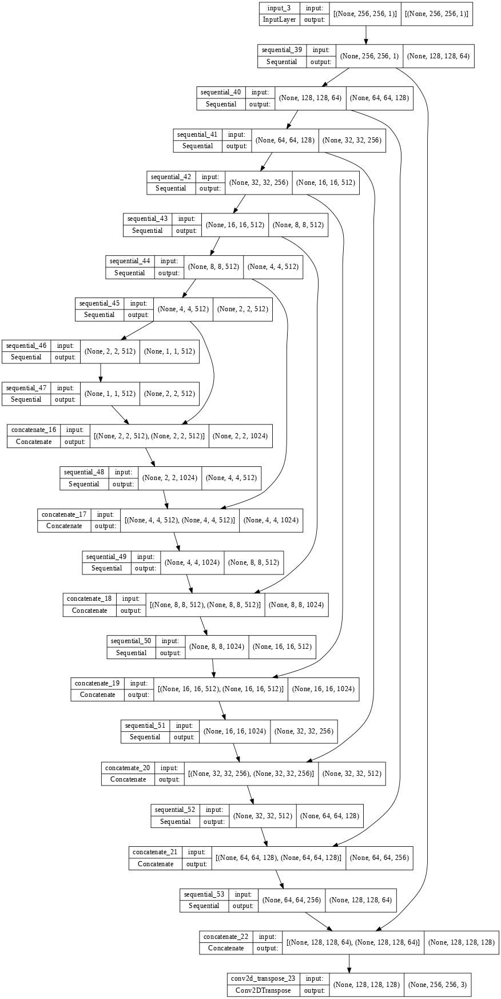

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

GENERATOR LOSS

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

DISCRIMINATOR

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

VISUALIZING DISCRIMINATOR

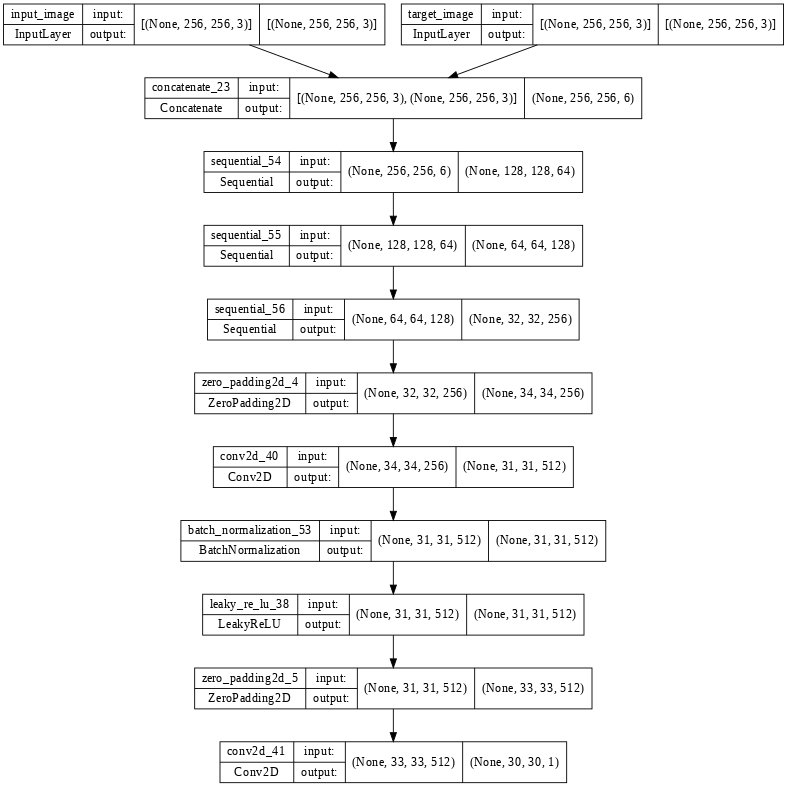

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

DISCRIMINATOR LOSS

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

OPTIMIZERS FOR GENERATOR AND DISCRIMINATOR

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

DEFINING CHECKPOINTS

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/4_PES1UG19CS303_IMAGE_COLORIZATION/checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

GENERATING IMAGES

In [ ]:
def generate_images(model, input_image,gray):
  prediction = model(gray[tf.newaxis,...], training=True)
  plt.figure(figsize=(15, 15))
  display_list = [input_image, tf.squeeze(prediction)]
  title = [ 'Ground Truth', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

TESTING generate_images()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


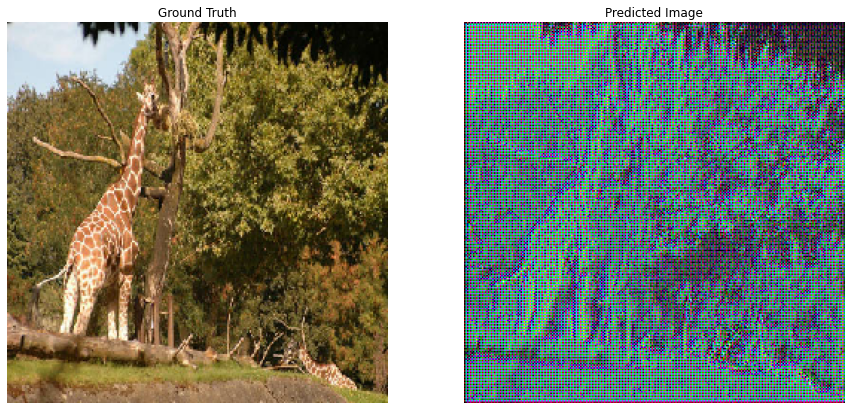

In [ ]:
generate_images(generator,inp,gray)

LOGGING

In [ ]:
log_dir="/content/drive/MyDrive/4_PES1UG19CS303_IMAGE_COLORIZATION/logs/"
summary_writer = tf.summary.create_file_writer(
log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

TRAIN STEP

In [ ]:
@tf.function
def train_step(target, input_image, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image[tf.newaxis,...], training=True)
    print(gen_output.shape,target.shape)
    disc_real_output = discriminator([target, target], training=True)
    disc_generated_output = discriminator([target, gen_output], training=True)
    target = tf.image.convert_image_dtype(target, dtype=tf.float32)
    gen_output = tf.image.convert_image_dtype(gen_output, dtype=tf.float32)  
    disc_generated_output = tf.image.convert_image_dtype(disc_generated_output, dtype=tf.float32)
    disc_real_output = tf.image.convert_image_dtype(disc_real_output, dtype=tf.float32)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

FITTING DATA

In [ ]:
def fit(train_ds, test_ds, steps):
  inp, gray = next(iter(test_ds.take(1)))
  start = time.time()
  for step, (Inp, Gray) in train_ds.repeat().take(steps).enumerate():
    if step % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()
      print(inp.shape,gray.shape)
      generate_images(generator,tf.squeeze(inp),tf.squeeze(gray))
      print(f"Step: {step//1000}k")
    #print(input_image.shape,target.shape)
    train_step(Inp, tf.squeeze(Gray), step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

SEEING RESULTS IN TENSORBOARD

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 795), started 5:45:57 ago. (Use '!kill 795' to kill it.)

<IPython.core.display.Javascript object>

FITTING DATASET

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Time taken for 1000 steps: 91.95 sec

(1, 256, 256, 3) (1, 256, 256, 1)


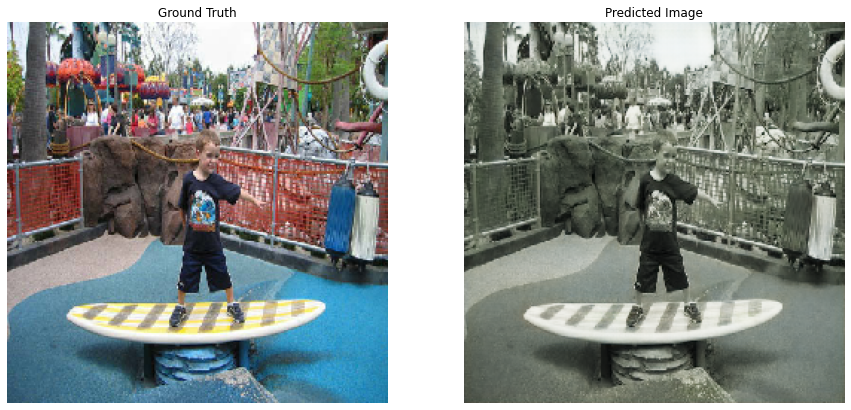

Step: 39k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

FEW TEST SAMPLES

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


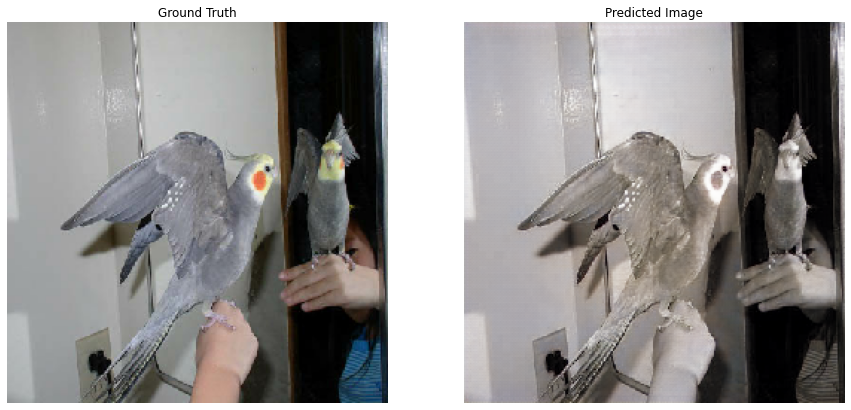

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


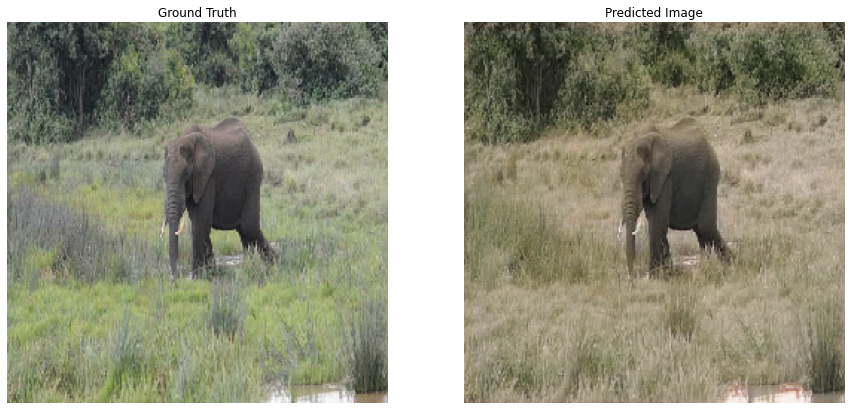

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


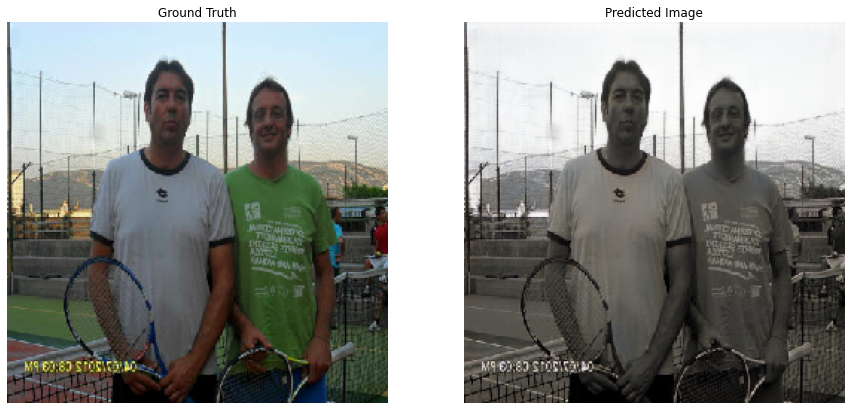

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


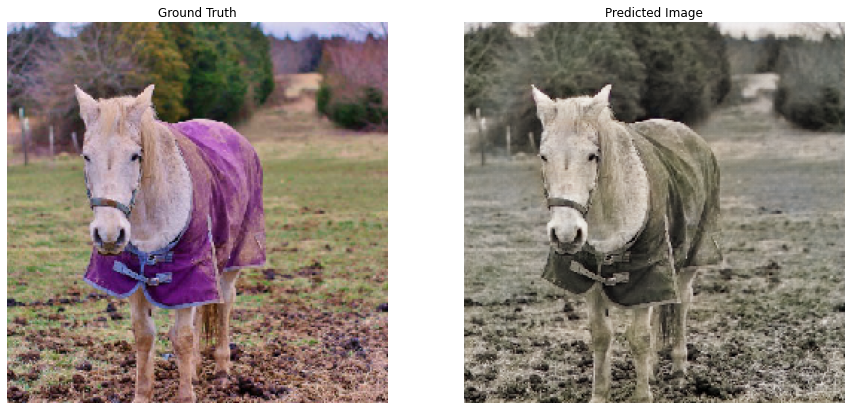

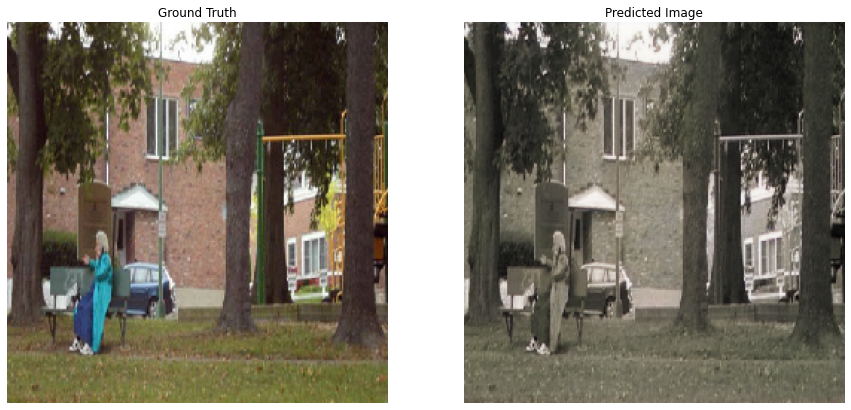

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, tf.squeeze(inp), tf.squeeze(tar))